# Importing the Required Directories

In [1]:
#Importing Libraries for Analysis
import numpy as np
import pandas as pd
#Importing Libraries for Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
#Importing Libraries for Preprocessing
from sklearn.preprocessing import LabelEncoder,StandardScaler
#Importing Libraries for Model Selection
from sklearn.model_selection import train_test_split,cross_val_score,KFold,GridSearchCV
# Importing the Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,BaggingClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier

from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

# About Dataset
**Context**
Access to safe drinking-water is essential to health, a basic human right and a component of effective policy for health protection. This is important as a health and development issue at a national, regional and local level. In some regions, it has been shown that investments in water supply and sanitation can yield a net economic benefit, since the reductions in adverse health effects and health care costs outweigh the costs of undertaking the interventions.

**Content**
The water_potability.csv file contains water quality metrics for 3276 different water bodies.

1. pH value:
PH is an important parameter in evaluating the acid–base balance of water. It is also the indicator of acidic or alkaline condition of water status. WHO has recommended maximum permissible limit of pH from 6.5 to 8.5. The current investigation ranges were 6.52–6.83 which are in the range of WHO standards.

2. Hardness:
Hardness is mainly caused by calcium and magnesium salts. These salts are dissolved from geologic deposits through which water travels. The length of time water is in contact with hardness producing material helps determine how much hardness there is in raw water. Hardness was originally defined as the capacity of water to precipitate soap caused by Calcium and Magnesium.

3. Solids (Total dissolved solids - TDS):
Water has the ability to dissolve a wide range of inorganic and some organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates etc. These minerals produced un-wanted taste and diluted color in appearance of water. This is the important parameter for the use of water. The water with high TDS value indicates that water is highly mineralized. Desirable limit for TDS is 500 mg/l and maximum limit is 1000 mg/l which prescribed for drinking purpose.

4. Chloramines:
Chlorine and chloramine are the major disinfectants used in public water systems. Chloramines are most commonly formed when ammonia is added to chlorine to treat drinking water. Chlorine levels up to 4 milligrams per liter (mg/L or 4 parts per million (ppm)) are considered safe in drinking water.

5. Sulfate:
Sulfates are naturally occurring substances that are found in minerals, soil, and rocks. They are present in ambient air, groundwater, plants, and food. The principal commercial use of sulfate is in the chemical industry. Sulfate concentration in seawater is about 2,700 milligrams per liter (mg/L). It ranges from 3 to 30 mg/L in most freshwater supplies, although much higher concentrations (1000 mg/L) are found in some geographic locations.

6. Conductivity:
Pure water is not a good conductor of electric current rather’s a good insulator. Increase in ions concentration enhances the electrical conductivity of water. Generally, the amount of dissolved solids in water determines the electrical conductivity. Electrical conductivity (EC) actually measures the ionic process of a solution that enables it to transmit current. According to WHO standards, EC value should not exceeded 400 μS/cm.

7. Organic_carbon:
Total Organic Carbon (TOC) in source waters comes from decaying natural organic matter (NOM) as well as synthetic sources. TOC is a measure of the total amount of carbon in organic compounds in pure water. According to US EPA < 2 mg/L as TOC in treated / drinking water, and < 4 mg/Lit in source water which is use for treatment.

8. Trihalomethanes:
THMs are chemicals which may be found in water treated with chlorine. The concentration of THMs in drinking water varies according to the level of organic material in the water, the amount of chlorine required to treat the water, and the temperature of the water that is being treated. THM levels up to 80 ppm is considered safe in drinking water.

9. Turbidity:
The turbidity of water depends on the quantity of solid matter present in the suspended state. It is a measure of light emitting properties of water and the test is used to indicate the quality of waste discharge with respect to colloidal matter. The mean turbidity value obtained for Wondo Genet Campus (0.98 NTU) is lower than the WHO recommended value of 5.00 NTU.

10. Potability:
Indicates if water is safe for human consumption where 1 means Potable and 0 means Not potable.

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Importing the Required Directories

In [3]:
#Accessing the Dataset
final_df=pd.read_csv('water_potability.csv')

In [4]:
#Look of the Dataset
final_df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


# Objectives

1. Analysing the data
2. Data cleaning and correlation
4. Data Simulation

In [5]:
#Shape of the Dataset
final_df.shape

(3276, 10)

**Observation:**
* The Following Dataset contains 3276 rows and 10 columns.

In [6]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [7]:
#Statistical Analysis
final_df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [8]:
#Checking the Null values of each column
final_df.isna().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

**Observation**
* Three columns are there that have Null values.
* The column names are ph,Sulfate and Trihalomethanes

# Exploratory Data Analysis

In [9]:
#Analyzing the Potability column
final_df['Potability'].value_counts()

0    1998
1    1278
Name: Potability, dtype: int64

In [10]:
#Visualizing the Potability column
fig=px.pie(final_df,values=final_df['Potability'].value_counts(), names=[0,1],title='<b>Potability Percentage',
          hole=0.4,
          color_discrete_sequence=px.colors.qualitative.Pastel,
          template='plotly_dark')
fig.update_layout(title_font_size=30)
fig.show()

**Potablity:** If Water safe for Drinking
* Potable---> 1(Water safe for Drinking)
* Not Potable--->0(Water not safe for Drinking)

**Observation**
* 61% of Water is not safe for Drinking and 39% is safe for Drinking

In [11]:
#Analyzing the ph feature
fig=px.histogram(final_df,x="ph",nbins=40,color_discrete_sequence=["#ffff00"],title="<b>PH Distribution",text_auto=True)
fig.update_layout(template="plotly_dark" )

fig.show()

**Observation**
* The PH is Normally Distributed.

In [12]:
#Checking the Outliers in ph feature using 3-Standard Deviation method
upper=final_df['ph'].mean() + 3*final_df['ph'].std()
lower=final_df['ph'].mean() - 3*final_df['ph'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper,lower))

Upper Limit is 11.863753060403265 and Lower Limit is 2.2978359481504045


**Observation:**
* The Upper Limit of ph distribution is 11.86
* The Lower Limit of ph distribution is 2.29

**Insight:**
* This will help me to remove the Outliers.

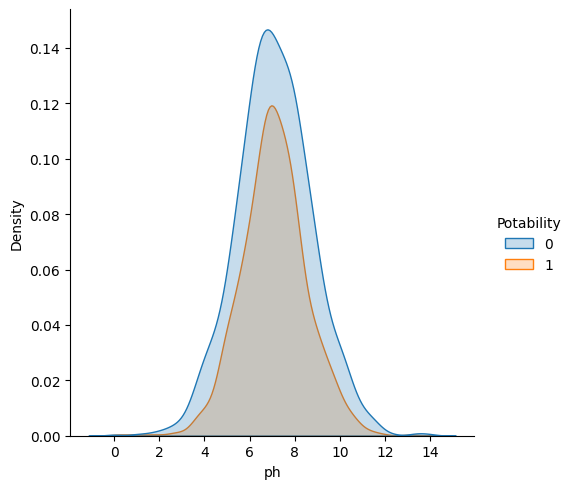

In [13]:
# Bivariate Analysis of ph with Potability

sns.displot(x=final_df['ph'],hue=final_df['Potability'],kind='kde',fill=True)

**Observation:**
* The Distribution of ph related to Potability is almost same.
* The Not Potable Water has more Ph level than of Potable Water.

In [14]:
# Analyzing the Hardness of the Water
fig=px.histogram(final_df,x="Hardness",nbins=40,color_discrete_sequence=["#80ffff"],title="<b>Hardness Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

**Observation:**
* The Hardness is Normally Distributed.

In [15]:
#Checking the Outliers in Hardness feature using 3-Standard Deviation method
upper_har=final_df['Hardness'].mean() + 3*final_df['Hardness'].std()
lower_har=final_df['Hardness'].mean() - 3*final_df['Hardness'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_har,lower_har))

Upper Limit is 295.008780446184 and Lower Limit is 97.73021158841905


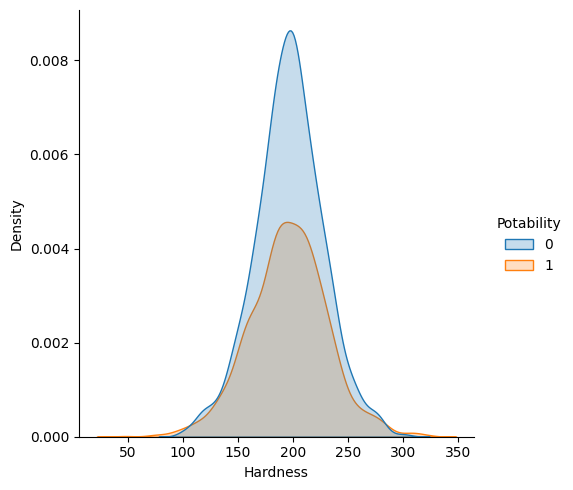

In [16]:
# Bivariate Analysis of Hardness with Potability

sns.displot(x=final_df['Hardness'],hue=final_df['Potability'],kind='kde',fill=True)

**Observation:**
* The Not Potable Water has more Hardness as compared to Potable Water.

In [17]:
fig=px.histogram(final_df,x="Solids",nbins=50,color_discrete_sequence=["#9999ff"],title="<b>Solids Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

In [18]:
#Checking the Outliers in Solids feature using 3-Standard Deviation method
upper_sol=final_df['Solids'].mean() + 3*final_df['Solids'].std()
lower_sol=final_df['Solids'].mean() - 3*final_df['Solids'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_sol,lower_sol))

Upper Limit is 48319.80500943489 and Lower Limit is -4291.619957280676


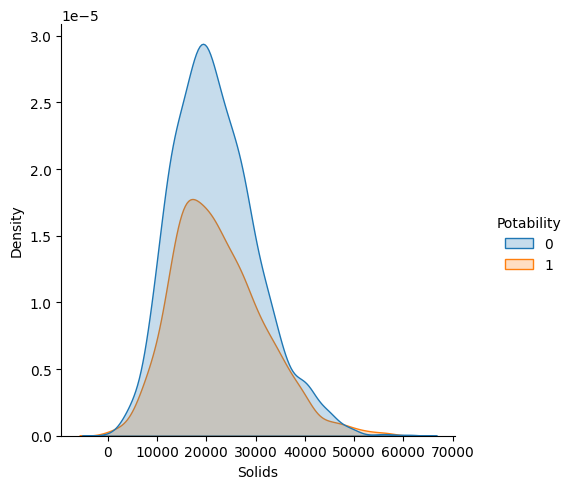

In [19]:
sns.displot(x=final_df['Solids'],hue=final_df['Potability'],kind='kde',fill=True)

In [20]:
# Analyzing the Chloramines of the Water
fig=px.histogram(final_df,x="Chloramines",nbins=40,color_discrete_sequence=["#99ff99"],title="<b>Chloramines Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

In [21]:
#Checking the Outliers in Chloramines feature using 3-Standard Deviation method
upper_chl=final_df['Chloramines'].mean() + 3*final_df['Chloramines'].std()
lower_chl=final_df['Chloramines'].mean() - 3*final_df['Chloramines'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_chl,lower_chl))

Upper Limit is 11.871531460544915 and Lower Limit is 2.3730221263066573


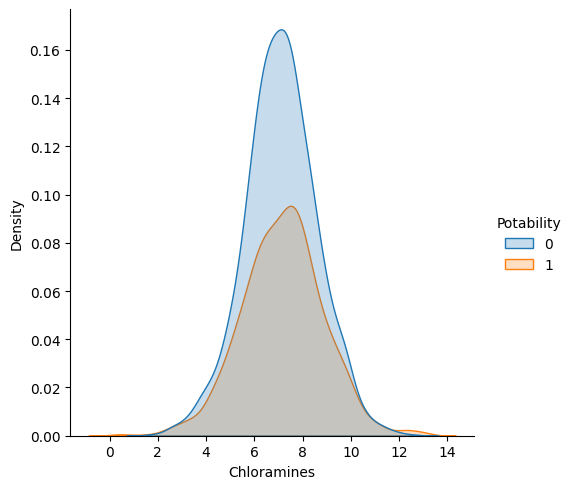

In [22]:
sns.displot(x=final_df['Chloramines'],hue=final_df['Potability'],kind='kde',fill=True)

In [23]:
# Analyzing the Sulfate of the Water
fig=px.histogram(final_df,x="Sulfate",nbins=40,color_discrete_sequence=["#ffd9b3"],title="<b>Sulfate Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

In [24]:
#Checking the Outliers in Sulfate feature using 3-Standard Deviation method
upper_sul=final_df['Sulfate'].mean() + 3*final_df['Sulfate'].std()
lower_sul=final_df['Sulfate'].mean() - 3*final_df['Sulfate'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_sul,lower_sul))

Upper Limit is 458.02629799583167 and Lower Limit is 209.5252552257954


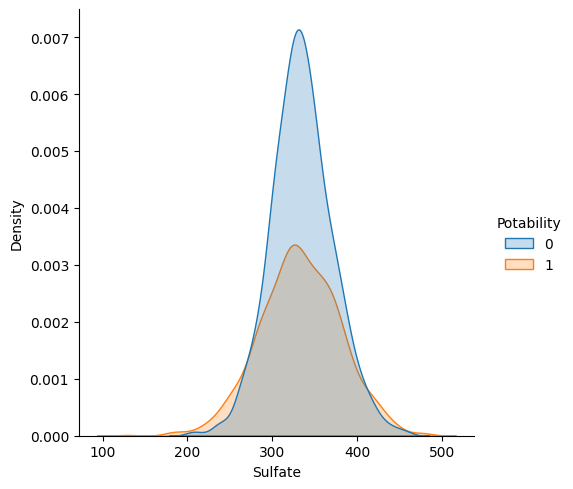

In [25]:
sns.displot(x=final_df['Sulfate'],hue=final_df['Potability'],kind='kde',fill=True)

In [26]:
# Analyzing the Conductivity of the Water
fig=px.histogram(final_df,x="Conductivity",nbins=40,color_discrete_sequence=["#f0b3ff"],title="<b>Conductivity Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

In [27]:
#Checking the Outliers in Conductivity feature using 3-Standard Deviation method
upper_cond=final_df['Conductivity'].mean() + 3*final_df['Conductivity'].std()
lower_cond=final_df['Conductivity'].mean() - 3*final_df['Conductivity'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_cond,lower_cond))

Upper Limit is 668.6773028358887 and Lower Limit is 183.73291852921784


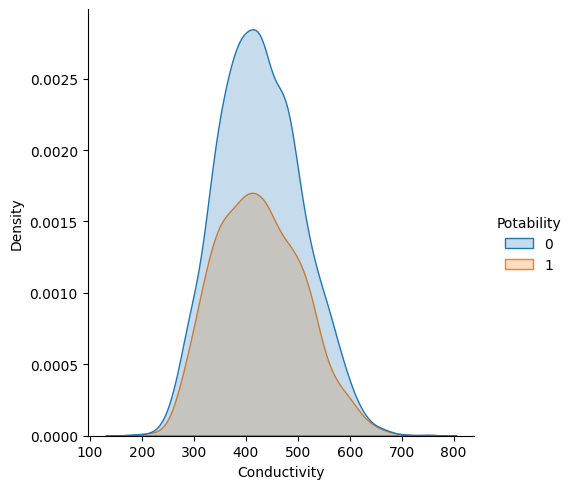

In [28]:
sns.displot(x=final_df['Conductivity'],hue=final_df['Potability'],kind='kde',fill=True)

In [29]:
# Analyzing the Organic_carbon of the Water
fig=px.histogram(final_df,x="Organic_carbon",nbins=40,color_discrete_sequence=["#ff99c2"],title="<b>Organic_carbon Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

In [30]:
#Checking the Outliers in Organic_carbon feature using 3-Standard Deviation method
upper_car=final_df['Organic_carbon'].mean() + 3*final_df['Organic_carbon'].std()
lower_car=final_df['Organic_carbon'].mean() - 3*final_df['Organic_carbon'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_car,lower_car))

Upper Limit is 24.20945624505794 and Lower Limit is 4.360484250296697


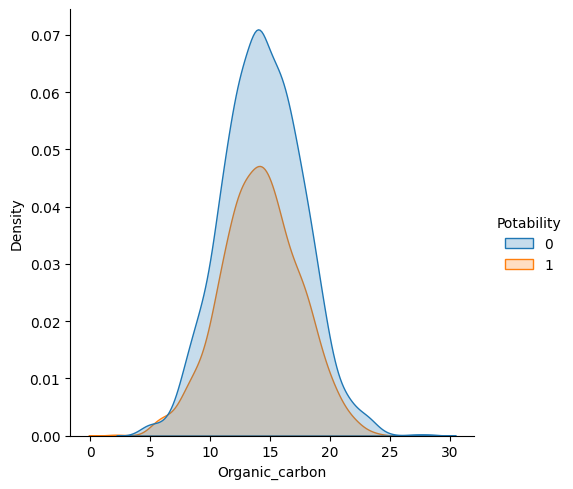

In [31]:
sns.displot(x=final_df['Organic_carbon'],hue=final_df['Potability'],kind='kde',fill=True)

In [32]:

# Analyzing the Trihalomethanes of the Water
fig=px.histogram(final_df,x="Trihalomethanes",nbins=40,color_discrete_sequence=["#00b3b3"],title="<b>Trihalomethanes Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

In [33]:
#Checking the Outliers in Trihalomethanes feature using 3-Standard Deviation method
upper_tri=final_df["Trihalomethanes"].mean() + 3*final_df["Trihalomethanes"].std()
lower_tri=final_df["Trihalomethanes"].mean() - 3*final_df["Trihalomethanes"].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_tri,lower_tri))

Upper Limit is 114.921318213424 and Lower Limit is 17.871267680112055


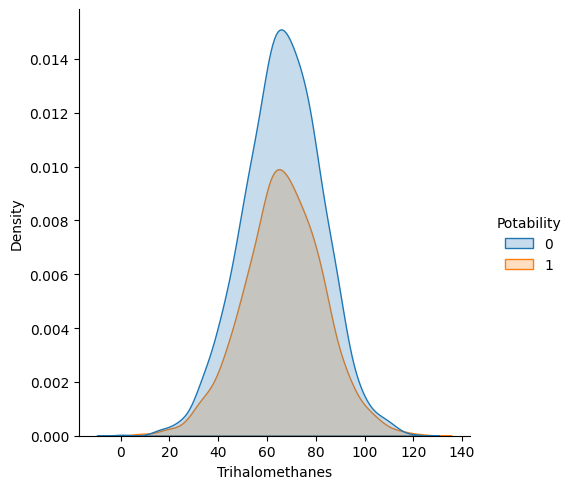

In [34]:
sns.displot(x=final_df['Trihalomethanes'],hue=final_df['Potability'],kind='kde',fill=True)

In [35]:

# Analyzing the Turbidity of the Water
fig=px.histogram(final_df,x="Turbidity",nbins=40,color_discrete_sequence=["#ffb366"],title="<b>Turbidity Distribution",text_auto=True)
fig.update_layout(template='plotly_dark')
fig.show()

In [36]:
#Checking the Outliers in Turbidity feature using 3-Standard Deviation method
upper_tur=final_df['Turbidity'].mean() + 3*final_df['Turbidity'].std()
lower_tur=final_df['Turbidity'].mean() - 3*final_df['Turbidity'].std()
print('Upper Limit is {} and Lower Limit is {}'.format(upper_tur,lower_tur))

Upper Limit is 6.307933395247295 and Lower Limit is 1.625638944334821


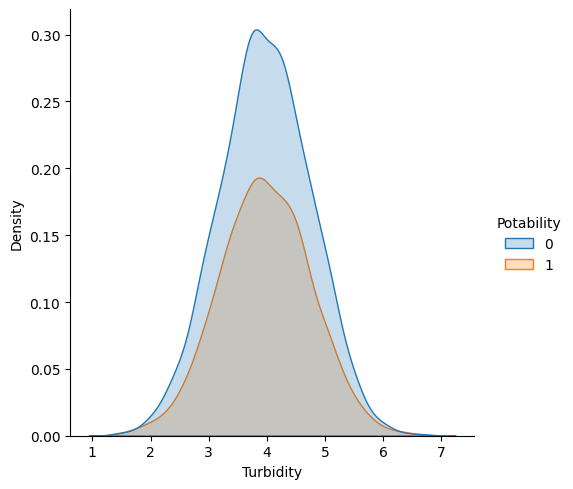

In [37]:
sns.displot(x=final_df['Turbidity'],hue=final_df['Potability'],kind='kde',fill=True)

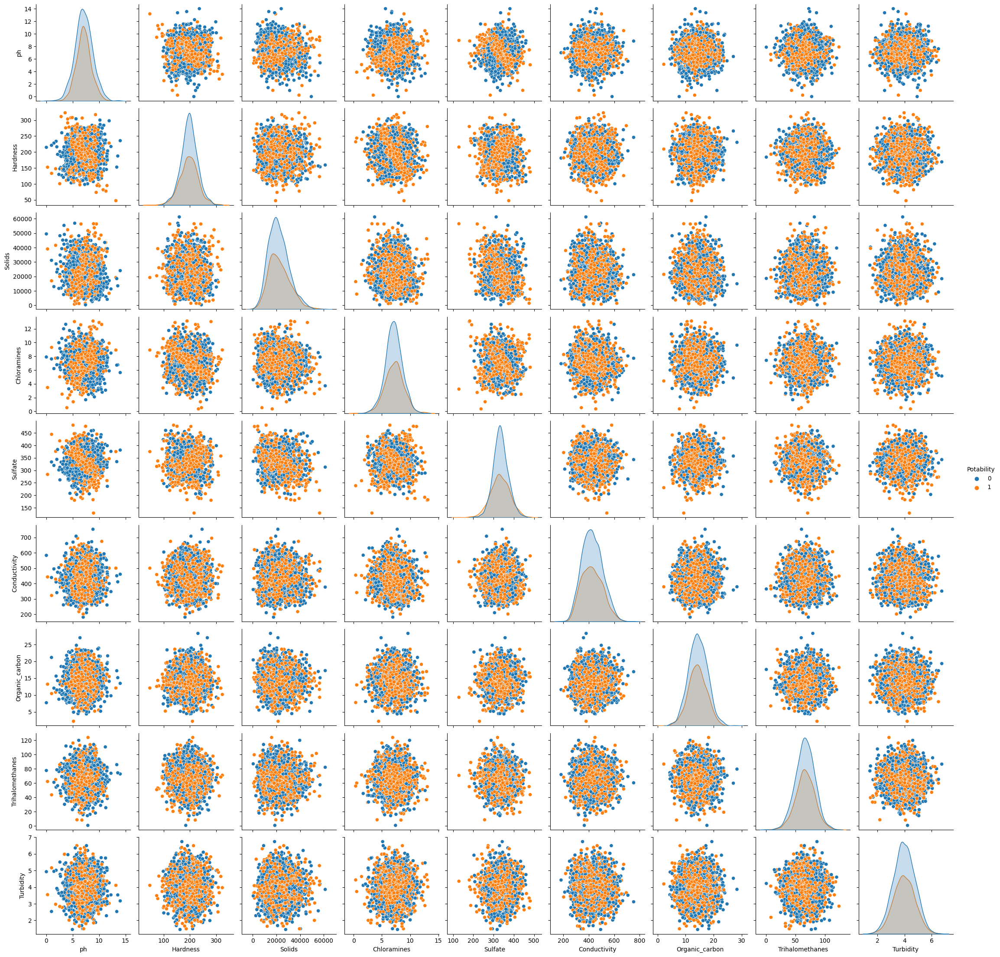

In [38]:
sns.pairplot(final_df,hue='Potability')

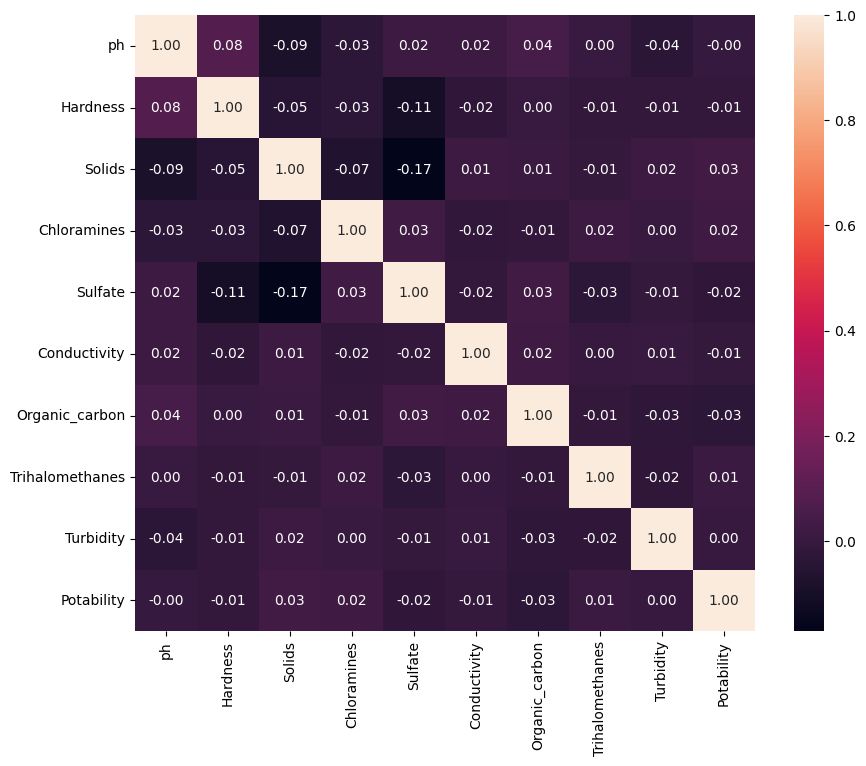

In [39]:
#Visualizing the Correlation Matrix of Features
plt.figure(figsize=(10,8))
sns.heatmap(final_df.corr(),annot=True,fmt='.2f')
plt.show()

**Observations:**
* All Features are Normally Distributed.
* Every Feature contains Few Outliers.
* Every Feature is not highly correlated with Potability Feature.

**Insights:**
* Remove all Outliers in order to improve the Accuracy of the Model.

# Feature Engineering

**Filling Missing Values**

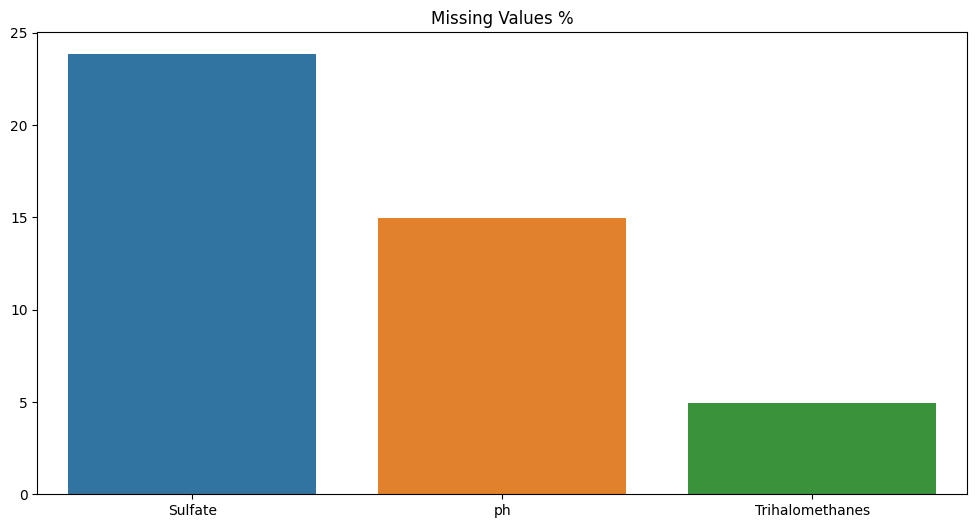

In [40]:
# Calculating the percentage of missing values

plt.figure(figsize=(10,6))

# Rounding the % calculation
missing_values=round(final_df.isna().sum()*100/len(final_df),2)

# Only considering the positive values
missing_values=missing_values[missing_values>0]

# Sorting the missing values for better plotting
missing_values.sort_values(inplace=True,ascending=False)


In [ ]:
# Plotting the missing values
sns.barplot(x=missing_values.index,y=missing_values.values)
plt.title('Percentage of missing values')
plt.show()

# Data Cleaning

### Filling the Missing Values

In this part we are substituting the missing values with mean values because out dataset is Features are normally distributed.


In [62]:
def RemoveMissingValues(data):
    
    # ph Mean
    ph_mean = data[(data['ph']>=lower) &(data['ph']<=upper)]['ph'].mean()
    data['ph'].fillna(ph_mean,inplace=True)

    # Sulfate Mean
    sulfate_mean = data[(data['Sulfate']>=lower_sul) &(data['Sulfate']<=upper_sul)]['Sulfate'].mean()
    data['Sulfate'].fillna(sulfate_mean,inplace=True)


    # Trihalomethanes Mean
    tri_mean = data[(data['Trihalomethanes']>=lower_tri) &(data['Trihalomethanes']<=upper_tri)]['Trihalomethanes'].mean()
    data['Trihalomethanes'].fillna(tri_mean,inplace=True)
    
    return data

In [63]:
final_df = RemoveMissingValues(final_df)

In [64]:
# Function to remove outliers from the dataset 

# The function checks the previously calculated upper and lower bound values of each individual data column
# and ignores/deletes all the outliers present in every column respectively.

def removeOutliers(data):
    data = data[(data['ph']>=lower) & (data['ph']<=upper)&
                        (data['Hardness']>=lower_har)&(data['Hardness']<=upper_har)&
                        (data['Solids']>=lower_sol)&(data['Solids']<=upper_sol)&
                        (data['Chloramines']>=lower_chl)&(data['Chloramines']<=upper_chl)&
                        (data['Sulfate']>=lower_sul)&(data['Sulfate']<=upper_sul)&
                        (data['Conductivity']>=lower_cond)&(data['Conductivity']<=upper_cond)&
                        (data['Organic_carbon']>=lower_car)&(data['Organic_carbon']<=upper_car)&
                        (data['Turbidity']>=lower_tur)&(data['Turbidity']<=upper_tur)&                      
                        (data['Trihalomethanes']>=lower_tri)&(data['Trihalomethanes']<=upper_tri)]
    return data


In [65]:
final_df = removeOutliers(final_df)

In [66]:
final_df.shape

(3161, 10)

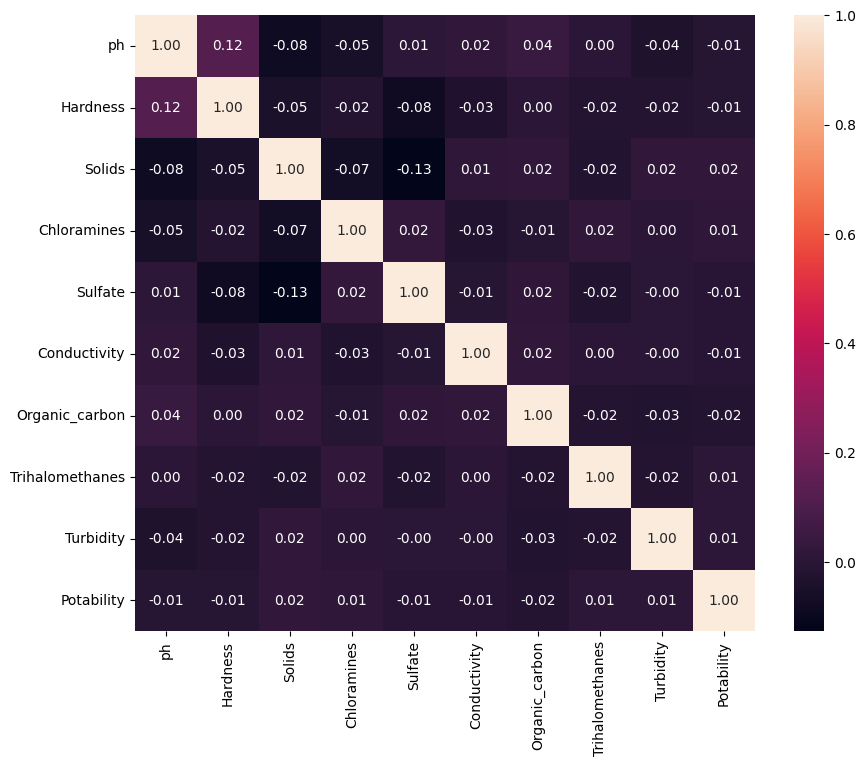

In [45]:
#Visualizing the Correlation Matrix of Features
plt.figure(figsize=(10,8))
sns.heatmap(final_df.corr(),annot=True,fmt='.2f')
plt.show()


# Splitting of Train and Test Data

In [46]:
X=final_df.drop('Potability',axis=1)
y=final_df['Potability']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [47]:
X_train.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
1238,6.582500,200.733107,23720.481730,8.565832,353.008115,458.362733,13.001881,79.529338,4.152014
715,7.085068,193.410141,14472.391549,5.640672,322.674462,431.457337,12.721922,92.758852,4.414819
1137,8.722144,151.621132,28301.516949,3.651961,248.094759,468.367451,15.151173,79.538368,3.274629
1162,11.244507,169.403655,43533.657845,5.888460,341.029600,336.446655,16.089710,59.494026,2.929953
2598,10.199413,256.704338,28703.751140,7.940595,326.462666,552.162181,8.802847,66.467172,4.384868


In [48]:
X_test.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
144,4.965774,220.848639,21802.744898,6.250578,311.598136,386.413332,18.035238,53.908177,3.421767
904,5.949519,160.442631,16898.808297,6.045906,367.328542,451.012788,16.359951,62.368234,4.072198
305,6.428866,225.613094,15596.473334,6.153472,334.085961,466.044399,18.015385,87.163631,4.184783
1293,7.293929,180.843125,15823.339374,7.721977,334.085961,457.520443,8.857599,37.734790,4.403250
632,7.085068,181.374651,14579.822073,5.435058,334.085961,308.792515,9.545092,60.214647,4.161749


In [49]:
y_train.head()

1238    0
715     1
1137    1
1162    1
2598    0
Name: Potability, dtype: int64

In [50]:
#Shape of the X_train and X_test
print(X_train.shape,X_test.shape)

(2528, 9) (633, 9)


# Standardization

In [51]:
#Standardizing the Dataset in order to get more accuracy
ss=StandardScaler()
X_train=ss.fit_transform(X_train)
X_test=ss.transform(X_test)

# Modelling

In [52]:
models={
    'Logistic Regression':LogisticRegression(),
    'Decision Trees':DecisionTreeClassifier(),
    'Random Forest':RandomForestClassifier(),
    'SVM Classifier':SVC(),
    'AdaBoost':AdaBoostClassifier(),
    'GradientBoosting Classifier':GradientBoostingClassifier(),
    'Bagging Classifier':BaggingClassifier()
}

In [53]:
#Training Different Models
for name,model in models.items():
    model.fit(X_train,y_train)
    print(f'{name} trained')

Logistic Regression trained
Decision Trees trained
Random Forest trained
SVM Classifier trained
AdaBoost trained
GradientBoosting Classifier trained
Bagging Classifier trained


# Evaluating the Models

In [54]:
results={}
for name,model in models.items():
    result=np.mean(cross_val_score(model,X_train,y_train,scoring='accuracy',cv=10))
    results[name]=result

In [55]:
for name,score in results.items():
    print(f"{name} : {round(score,3)}")

Logistic Regression : 0.614
Decision Trees : 0.586
Random Forest : 0.654
SVM Classifier : 0.665
AdaBoost : 0.599
GradientBoosting Classifier : 0.642
Bagging Classifier : 0.619


{'C': 0.1, 'max_iter': 100, 'penalty': 'l2'} 0.613924963924964
The Accuracy of Logistic Regression is :0.6287519747235387
              precision    recall  f1-score   support

           0       0.63      1.00      0.77       398
           1       0.00      0.00      0.00       235

    accuracy                           0.63       633
   macro avg       0.31      0.50      0.39       633
weighted avg       0.40      0.63      0.49       633



<AxesSubplot: >

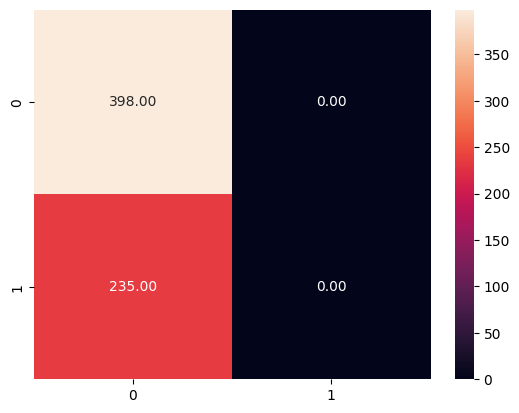

In [56]:
#Applying Logistic Regression using GridSearchCV
param_grid={
    'penalty':['l1','l2','elasticnet','none'],
    'C':[0.1,0.5,1,2,3,4,5,10,100],
    'max_iter':[100,200,300,500,1000]      
           }
grid_lr=GridSearchCV(LogisticRegression(),param_grid,scoring='accuracy',cv=10)
grid_lr.fit(X_train,y_train)
print(grid_lr.best_params_,grid_lr.best_score_)
y_pred_lr=grid_lr.predict(X_test)
print('The Accuracy of Logistic Regression is :{}'.format(accuracy_score(y_test,y_pred_lr)))
print(classification_report(y_test,y_pred_lr))
sns.heatmap(confusion_matrix(y_test,y_pred_lr),annot=True,fmt='.2f')

In [57]:
print(grid_lr.best_params_,
grid_lr.best_score_)

{'C': 0.1, 'max_iter': 100, 'penalty': 'l2'} 0.613924963924964


In [58]:
#Applying Decision Tree using GridSearchCV

param_grid={
    'criterion':['gini','entropy','log_loss'],
    'max_depth':[1,5,6,7,8,9,10,20,50,'None']
}
grid_DT=GridSearchCV(DecisionTreeClassifier(),param_grid,cv=10,scoring='accuracy')
grid_DT.fit(X_train,y_train)
print(grid_DT.best_params_,grid_DT.best_score_)

{'criterion': 'entropy', 'max_depth': 7} 0.647557876905703


The Accuracy of Decision Tree is :0.6571879936808847
              precision    recall  f1-score   support

           0       0.67      0.90      0.77       398
           1       0.59      0.25      0.35       235

    accuracy                           0.66       633
   macro avg       0.63      0.57      0.56       633
weighted avg       0.64      0.66      0.61       633



<AxesSubplot: >

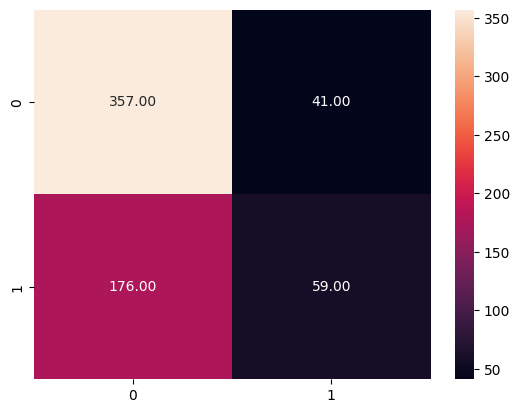

In [59]:
y_pred_DT=grid_DT.predict(X_test)
print('The Accuracy of Decision Tree is :{}'.format(accuracy_score(y_test,y_pred_DT)))
print(classification_report(y_test,y_pred_DT))
sns.heatmap(confusion_matrix(y_test,y_pred_DT),annot=True,fmt='.2f')

In [ ]:
#Applying Random Forest using GridSearchCV
param_grid={
    'n_estimators':[50,100,200,300],
    'criterion':['gini','entropy','log_loss'],
    'max_depth':[5,6,7,8,9,10,20,50,100],
    'oob_score':['True']
}
grid_RF=GridSearchCV(RandomForestClassifier(),param_grid,cv=10,scoring='accuracy')
grid_RF.fit(X_train,y_train)
print(grid_RF.best_params_,grid_RF.best_score_)

In [ ]:
y_pred_RF=grid_RF.predict(X_test)
print('The Accuracy of the Random Forest is :{}'.format(accuracy_score(y_test,y_pred_RF)))
print(classification_report(y_test,y_pred_RF))
sns.heatmap(confusion_matrix(y_test,y_pred_RF),annot=True,fmt='.2f')

In [ ]:
#Applying SVM Classifier using GridSearchCV
param_grid={
    'C':[0.1,0.5,1,2,3,4,5],
    'kernel':['linear', 'poly', 'rbf', 'sigmoid'],
    'degree':[3,4,5,6,7]
    
}
grid_SVC=GridSearchCV(SVC(),param_grid,cv=10,scoring='accuracy')
grid_SVC.fit(X_train,y_train)
print(grid_SVC.best_params_,grid_SVC.best_score_)

In [ ]:
y_pred_SVC=grid_SVC.predict(X_test)
print('The Accuracy of SVC is :{}'.format(accuracy_score(y_test,y_pred_SVC)))
print(classification_report(y_test,y_pred_SVC))
sns.heatmap(confusion_matrix(y_test,y_pred_SVC),annot=True,fmt='.2f')

In [ ]:
#Applying AdaBoostClassifier using GridSearchCV
param_grid={
    'n_estimators':[10,20,30,50,100,200,300],
    'learning_rate':[0.1,0.5,1,2,3,4,5,10]
}
grid_AB=GridSearchCV(AdaBoostClassifier(),param_grid,cv=10,scoring='accuracy')
grid_AB.fit(X_train,y_train)
print(grid_AB.best_params_,grid_AB.best_score_)

In [ ]:
y_pred_AB=grid_AB.predict(X_test)
print('The Accuracy of AdaBoost is :{}'.format(accuracy_score(y_test,y_pred_AB)))
print(classification_report(y_test,y_pred_AB))
sns.heatmap(confusion_matrix(y_test,y_pred_AB),annot=True,fmt='.2f')

In [ ]:
#Applying GradientBoostingClassifier using GridSearchCV
param_grid={
    'n_estimators':[50,100,200,300],
    'learning_rate':[0.1,0.5,1,2,3,4,5]
}
grid_GDC=GridSearchCV(GradientBoostingClassifier(),param_grid,cv=10,scoring='accuracy')
grid_GDC.fit(X_train,y_train)
print(grid_GDC.best_params_,grid_GDC.best_score_)

In [ ]:
y_pred_GDC=grid_GDC.predict(X_test)
print('The Accuracy of GradientBoostingClassifier is :{}'.format(accuracy_score(y_test,y_pred_GDC)))
print(classification_report(y_test,y_pred_GDC))
sns.heatmap(confusion_matrix(y_test,y_pred_GDC),annot=True,fmt='.2f')

In [ ]:
#Applying Bagging Classifier using GridSearchCV
param_grid={
    'n_estimators':[10,20,30,50,100]
}
grid_BC=GridSearchCV(BaggingClassifier(),param_grid,cv=10,scoring='accuracy')
grid_BC.fit(X_train,y_train)
print(grid_BC.best_params_,grid_BC.best_score_)

In [ ]:
print(grid_BC.best_params_,grid_BC.best_score_)

In [ ]:
y_pred_BC=grid_BC.predict(X_test)
print('The Accuracy of BoostingClassifier is :{}'.format(accuracy_score(y_test,y_pred_BC)))
print(classification_report(y_test,y_pred_BC))
sns.heatmap(confusion_matrix(y_test,y_pred_BC),annot=True,fmt='.2f')

# Conclusion
* The Support Vector Classifier is giving us the accuracy of 70%.
* The Accuracy is low because the Features are not highly correlated with the Target.
* The Accuracy can be increased by Hyperparameter Tuning.